# Set up

In [1]:
import dask
import xarray as xr
import matplotlib as mpl
import matplotlib.pyplot as plt
import math
import cartopy.crs as ccrs
import numpy as np
from matplotlib import animation
from datetime import datetime as dt
import warnings
plt.close('all')

In [2]:
path='H:/Summer24-25/'
with warnings.catch_warnings():
    warnings.simplefilter('ignore')
    ds_hist = xr.open_mfdataset(path+'*_Amon_CESM2-WACCM-FV2_historical_r1i1p1f1_gn*.nc') 
    # ds_new = xr.open_mfdataset(path+'*_Amon_CESM2-WACCM_ssp126_r1i1p1f1_gn*.nc') 
    # ds_combined = xr.open_mfdataset(path+'*_Amon_CESM2-WACCM*r1i1p1f1_gn*.nc') 

# change plev from Pa -> hPa
for ds in [ds_hist]:#, ds_new, ds_combined]:
    ds['plev'] = ds.plev / 100
    ds.plev.attrs['units'] = 'hPa'
    ds.plev.attrs['requested'] = '1000. 925. 850. 700. 600. 500. 400. 300. 250. 200. 150. 100. 70. 50. 30. 20. 10. 5. 1.'

In [3]:
ds_hist

<xarray.Dataset> Size: 378MB
Dimensions:    (time: 180, plev: 19, lat: 96, lon: 144, nbnd: 2)
Coordinates:
  * lat        (lat) float64 768B -90.0 -88.11 -86.21 ... 86.21 88.11 90.0
  * lon        (lon) float64 1kB 0.0 2.5 5.0 7.5 ... 350.0 352.5 355.0 357.5
  * plev       (plev) float64 152B 1e+03 925.0 850.0 700.0 ... 20.0 10.0 5.0 1.0
  * time       (time) object 1kB 2000-01-15 12:00:00 ... 2014-12-15 12:00:00
Dimensions without coordinates: nbnd
Data variables:
    ua         (time, plev, lat, lon) float32 189MB dask.array<chunksize=(1, 19, 96, 144), meta=np.ndarray>
    time_bnds  (time, nbnd) object 3kB dask.array<chunksize=(1, 2), meta=np.ndarray>
    lat_bnds   (lat, nbnd) float64 2kB dask.array<chunksize=(96, 2), meta=np.ndarray>
    lon_bnds   (lon, nbnd) float64 2kB dask.array<chunksize=(144, 2), meta=np.ndarray>
    va         (time, plev, lat, lon) float32 189MB dask.array<chunksize=(1, 19, 96, 144), meta=np.ndarray>
Attributes: (12/45)
    Conventions:            CF-1.7 CMIP-6.2
    activity_id:            CMIP
    branch_method:          standard
    branch_time_in_child:   674885.0
    branch_time_in_parent:  10950.0
    case_id:                1562
    ...                     ...
    sub_experiment_id:      none
    table_id:               Amon
    tracking_id:            hdl:21.14100/953d2903-6c72-49d5-8f1d-229c97d2fe01
    variable_id:            ua
    variant_info:           CMIP6 CESM2 historical ensemble with WACCM6-FV2 (...
    variant_label:          r1i1p1f1

# Separate

In [4]:
date = dt.strptime(str(ds_hist.time.isel(time=25).values), '%Y-%m-%d %H:%M:%S')
print('original: %s' %date)

formatted_date = date.strftime('%d %B, %Y')
print('formatted: %s' %formatted_date)

original: 2002-02-14 00:00:00
formatted: 14 February, 2002


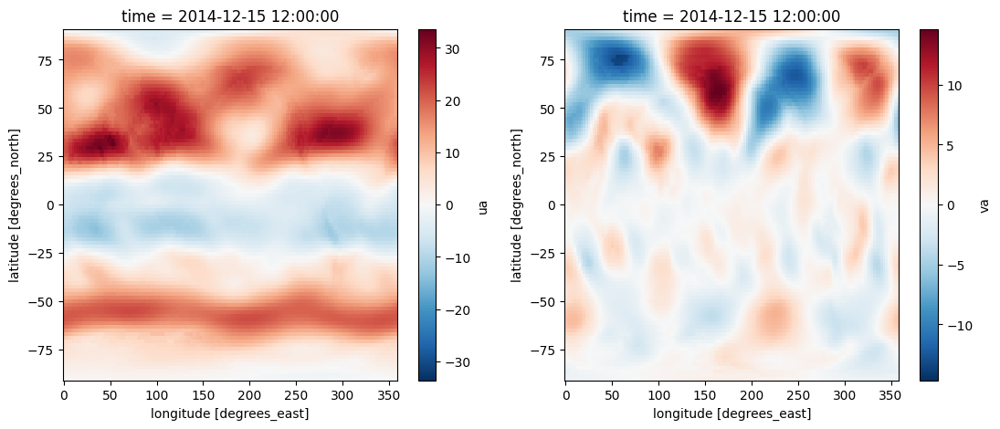

In [5]:
fig,(ax1, ax2) = plt.subplots(1,2, figsize=(13,5))
ds_hist.ua.isel(time=-1).mean(dim='plev').plot(ax=ax1)
ds_hist.va.isel(time=-1).mean(dim='plev').plot(ax=ax2)

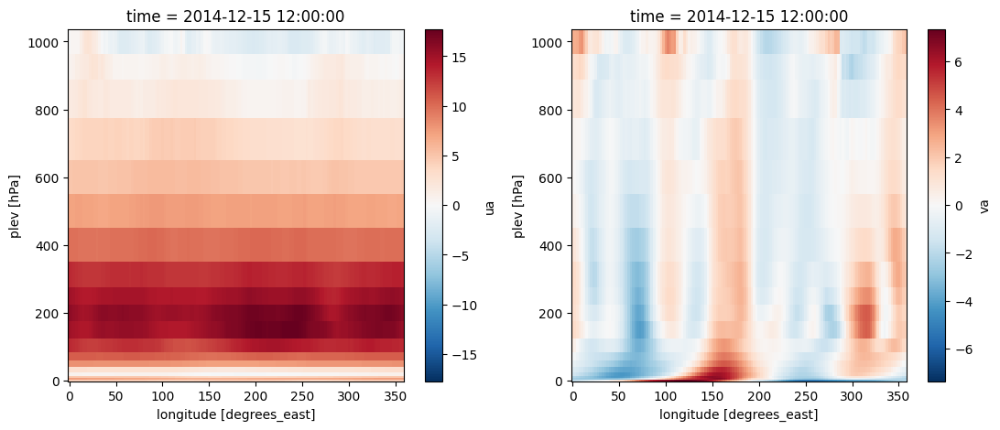

In [6]:
mean_dim = 'lat'
# mean_dim = 'plev' # average pressure, y-axis=latitude level
fig,(ax1, ax2) = plt.subplots(1,2, figsize=(13,5))
ds_hist.ua.isel(time=-1).mean(dim=mean_dim).plot(ax=ax1)
ds_hist.va.isel(time=-1).mean(dim=mean_dim).plot(ax=ax2)

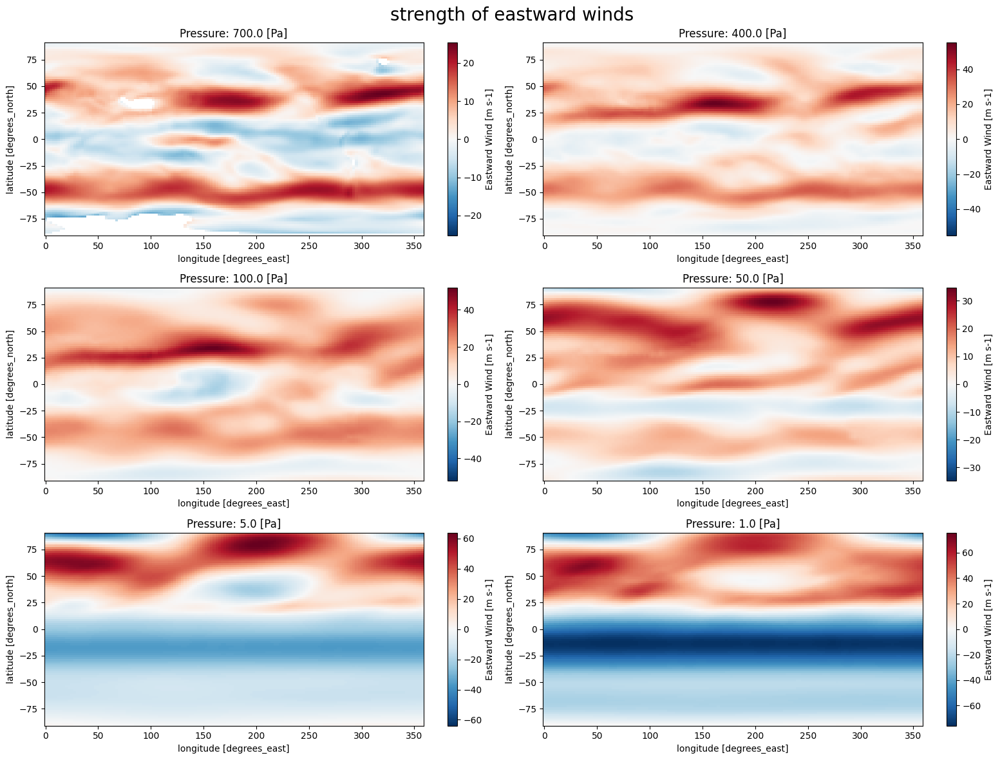

In [7]:
plevs = [700, 400, 100, 50, 5, 1] # measured in hPa
row,col = math.ceil(len(plevs)**0.5), round(len(plevs)**0.5)

fig, axs = plt.subplots(row,col, figsize=(col*8, row*4), layout='tight')
fig.suptitle('strength of eastward winds', size=20) 
# fig.suptitle('strength of northern winds', size=20) 
i = 0
for row in axs:
    for ax in row:
        if i < len(plevs):
            ds_hist.ua.isel(time=0).sel(plev=plevs[i]).plot(ax=ax)
            # ds_hist.va.isel(time=0).sel(plev=plevs[i]).plot(ax=ax) # uncomment and comment out above to get northern winds
            ax.set_title('Pressure: %s [Pa]' %(ds_hist.plev.sel(plev=plevs[i]).values))
            i += 1
        else:
            ax.remove()


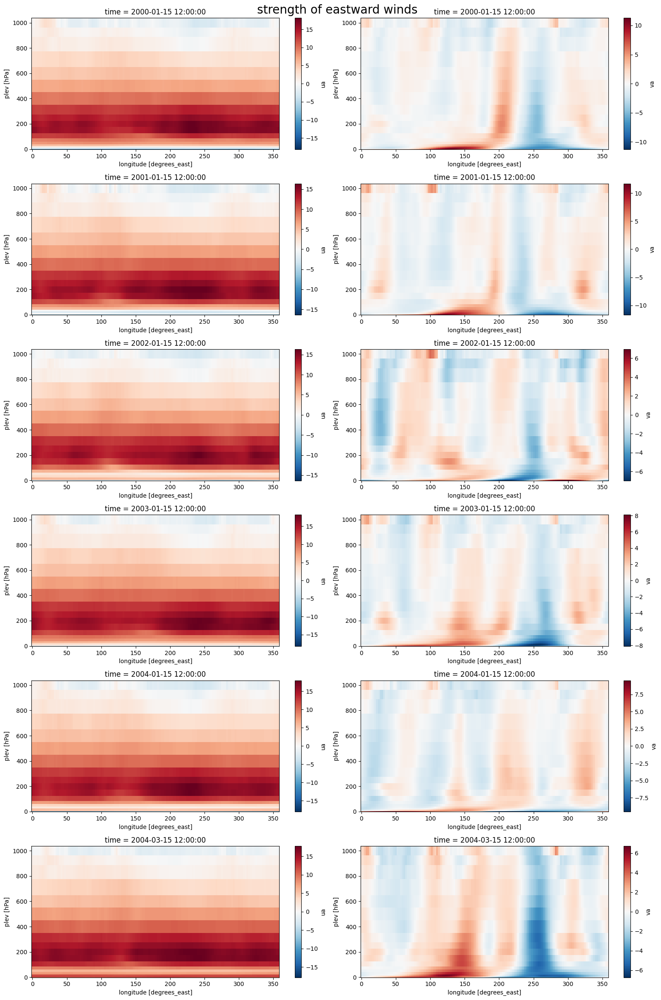

In [8]:
times = [0, 12, 24, 36, 48, 50] # measured in Pa
row,col = len(times), 2

fig, axs = plt.subplots(row,col, figsize=(col*8, row*4), layout='tight')
fig.suptitle('strength of eastward winds', size=20) 
# fig.suptitle('strength of northern winds', size=20) 
i = 0
for row in axs:
    date = dt.strptime(str(ds_hist.time.isel(time=times[i]).values), '%Y-%m-%d %H:%M:%S')
    formatted_date = date.strftime('%d %B, %Y')
    axs[i,0].set_title('Time: %s' %formatted_date); axs[i,1].set_title('Time: %s' %formatted_date)
    ds_hist.ua.isel(time=times[i]).mean(dim='lat').plot(ax=axs[i,0])
    ds_hist.va.isel(time=times[i]).mean(dim='lat').plot(ax=axs[i,1])
    i+= 1


# Quiver

## basic

CPU times: total: 46.9 ms
Wall time: 46.9 ms


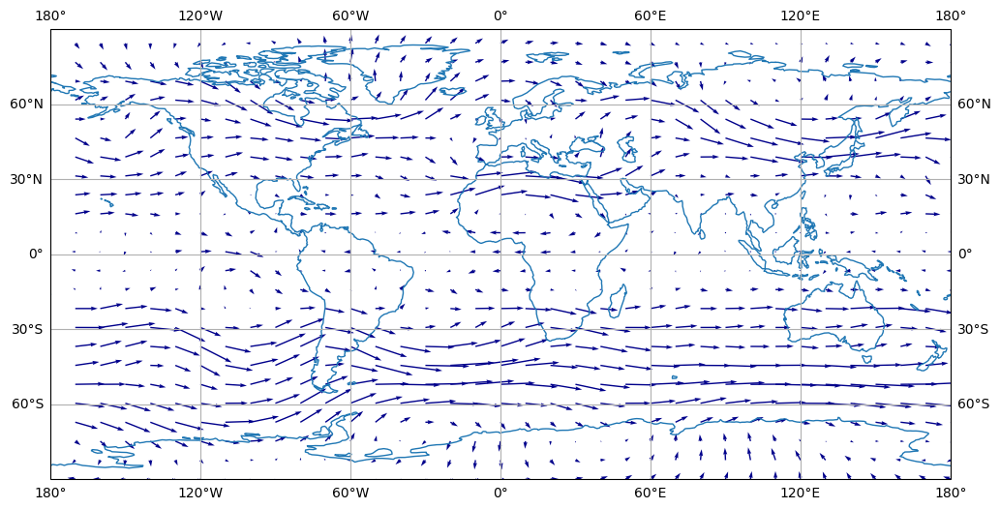

In [9]:
%%time
n=100
p=6
ds = ds_hist

fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())
u = ds.ua.isel(plev=p, time=n)[::4, ::4] # slicing to get every 4th element
v = ds.va.isel(plev=p, time=n)[::4, ::4]


qv = ax.quiver(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), scale=700, width=0.0015, color='darkblue')
ax.coastlines(color='tab:blue')
ax.gridlines(draw_labels=True)

CPU times: total: 15.6 ms
Wall time: 15.7 ms


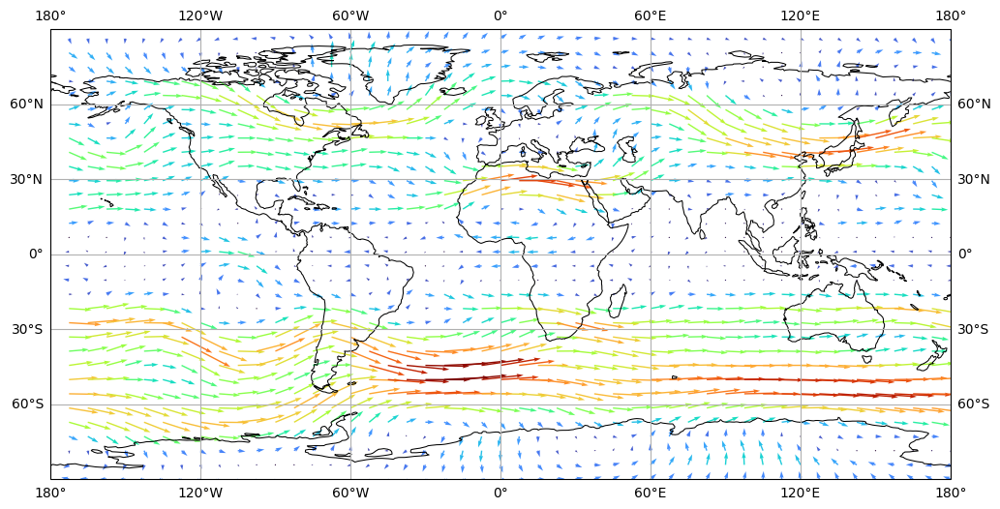

In [10]:
%%time
n=100
p=6
ds = ds_hist

fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())
u = ds.ua.isel(plev=p, time=n)[::3, ::3] # slicing to get every 4th element
v = ds.va.isel(plev=p, time=n)[::3, ::3]
windspeed = (v**2 + u**2)**0.5

qv = ax.quiver(u.lon, u.lat, u, v, windspeed, cmap='turbo', transform=ccrs.PlateCarree(), scale=700, width=0.0015)
ax.coastlines(color='k', lw=0.75)
ax.gridlines(draw_labels=True)

CPU times: total: 1.06 s
Wall time: 1.88 s


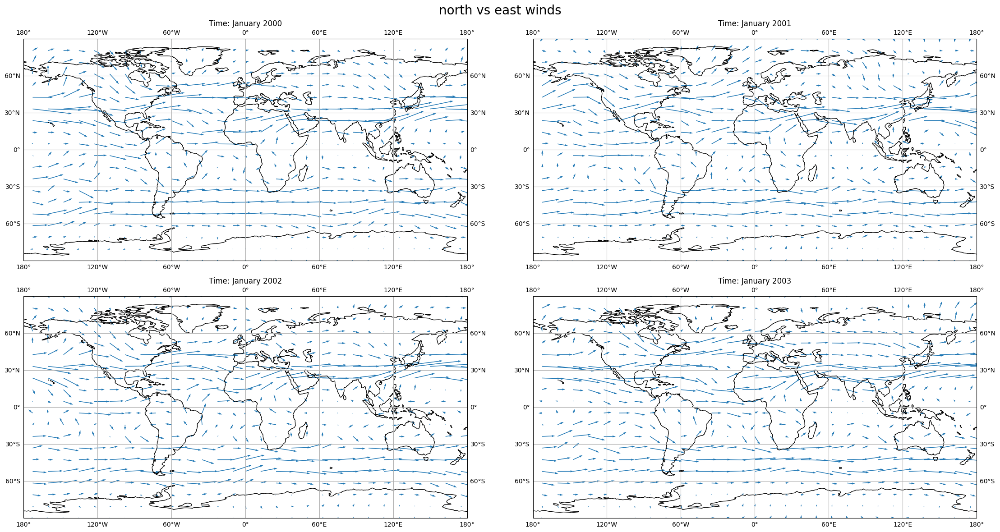

In [11]:
%%time
ds = ds_hist
times = np.arange(0,12*4, 12)
row,col = math.ceil(len(times)**0.5), round(len(times)**0.5)

fig, axs = plt.subplots(row,col, figsize=(col*12, row*6), layout='tight', subplot_kw=
                        {'projection': ccrs.PlateCarree()})
fig.suptitle('north vs east winds', size=20)
i = 0
for ax in axs.flat:
    if i < len(times):
        u = ds.ua.isel(plev=9, time=times[i])[::5, ::5] # slicing to get every 5th point
        v = ds.va.isel(plev=9, time=times[i])[::5, ::5]
        ax.quiver(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), scale=800, width=0.0015, color='tab:blue')
        ax.coastlines(color='k')
        ax.gridlines(draw_labels=True)
        
        date = dt.strptime(str(ds.time[times[i]].values), '%Y-%m-%d %H:%M:%S')
        formatted = date.strftime('%B %Y')
        ax.set_title('Time: %s' %formatted)
        
        i += 1
    else:
        ax.remove()

fig.savefig('quiver_wind.png') #note: for the bigger plots, they will look bad in the notebook **they will be higher quality/clearer downloaded**

## animations

In [12]:
%%time

# required values for animation
ds = ds_combined
pressure = 200
frames = ds.time.size
col = 'tab:blue' #colour of quiver plot arrows
prediction_point = dt.strptime('1/1/15', '%x') # time where data switches from historical data to predicted values
prediction_col = 'indianred' #colour to switch to when predicting

fig = plt.figure(figsize=(11,6))
ax = plt.axes(projection=ccrs.PlateCarree())

fig.suptitle('Global wind patterns at %spa' %pressure)

def animate(num, col=col):
    ax.clear()
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    if(prediction_point < date):
        col = prediction_col
        ax.text(0.99, 1.05, 'Future predicted values', transform=ax.transAxes, ha='right', color = col, size = 15)

    formatted = date.strftime('%Y %B')
    ax.text(0.01, 1.05, formatted, ha='left', transform=ax.transAxes)
    
    u = ds.ua.isel(time=num).sel(plev=pressure)[::4, ::4] # slicing to get every 4th element
    v = ds.va.isel(time=num).sel(plev=pressure)[::4, ::4]
    
    qv = ax.quiver(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), scale=800, width=0.001, color=col, headwidth=5)

    ax.coastlines(color='k', alpha=0.5)
    # ax.gridlines(draw_labels=True, color='none')
    

ani = animation.FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_qv_basic.gif', writer='pillow')

NameError: name 'ds_combined' is not defined

CPU times: total: 1min 16s
Wall time: 1min 20s


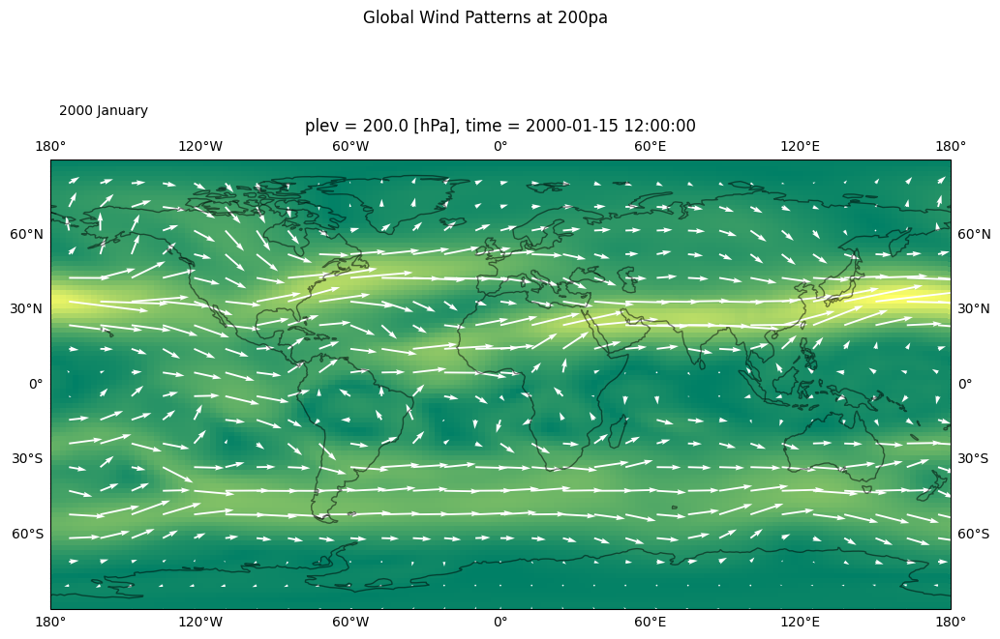

In [13]:
%%time

ds = ds_hist
pressure = 200
frames = ds.ua.time.size


fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())

fig.suptitle('Global Wind Patterns at %spa' %pressure)

def animate(num):
    ax.clear()
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%Y %B')
    ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)
    ax.set_title('')
    ax.coastlines(color='k', alpha=0.5)
    ax.gridlines(draw_labels=True, color='none')
    
    u = ds.ua.isel(time=num).sel(plev=pressure)
    v = ds.va.isel(time=num).sel(plev=pressure)
    
    windspeed = (u**2 + v**2)**0.5
    windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='summer', add_colorbar=False)

    u = u[::5, ::5]# slicing to get every 5th element
    v = v[::5, ::5]
    
    qv = ax.quiver(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), scale=800, width=0.002, color='w')
    

ani = animation.FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_qv_background.gif', writer='pillow')

CPU times: total: 15.9 s
Wall time: 19 s


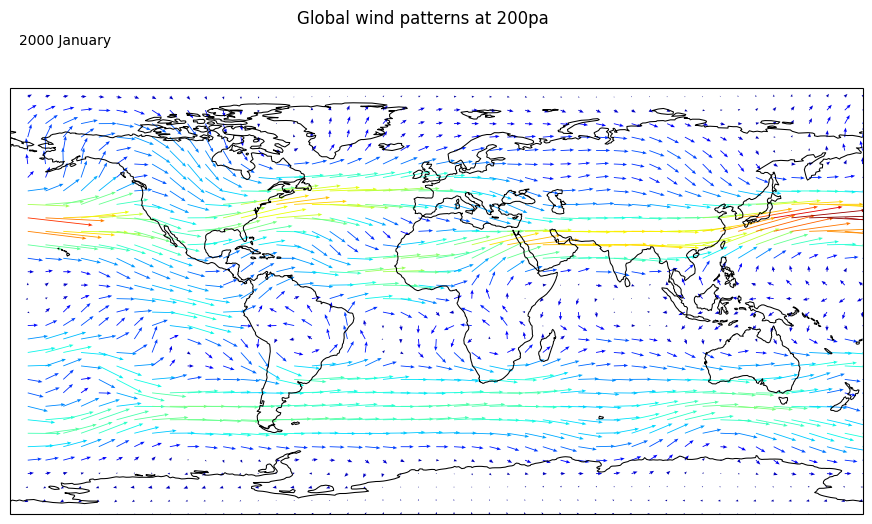

In [14]:
%%time

ds = ds_hist
pressure = 200
frames = ds.ua.time.size

fig = plt.figure(figsize=(11,6))
ax = plt.axes(projection=ccrs.PlateCarree())

fig.suptitle('Global wind patterns at %spa' %pressure)

def animate(num):
    ax.clear()
    u = ds.ua.isel(time=num).sel(plev=pressure)[::3, ::3] # slicing to get every 4th element
    v = ds.va.isel(time=num).sel(plev=pressure)[::3, ::3]
    windspeed = (u**2 + v**2)**0.5
    
    qv = ax.quiver(u.lon, u.lat, u, v, windspeed, transform=ccrs.PlateCarree(), scale=900, width=0.001, cmap='jet', headwidth=4)

    ax.coastlines(color='k', linewidth=0.75)
    # ax.gridlines(draw_labels=True, color='none')

    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%Y %B')
    ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)
    

ani = animation.FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_qv_colour.gif', writer='pillow')

CPU times: total: 29.6 s
Wall time: 31.1 s


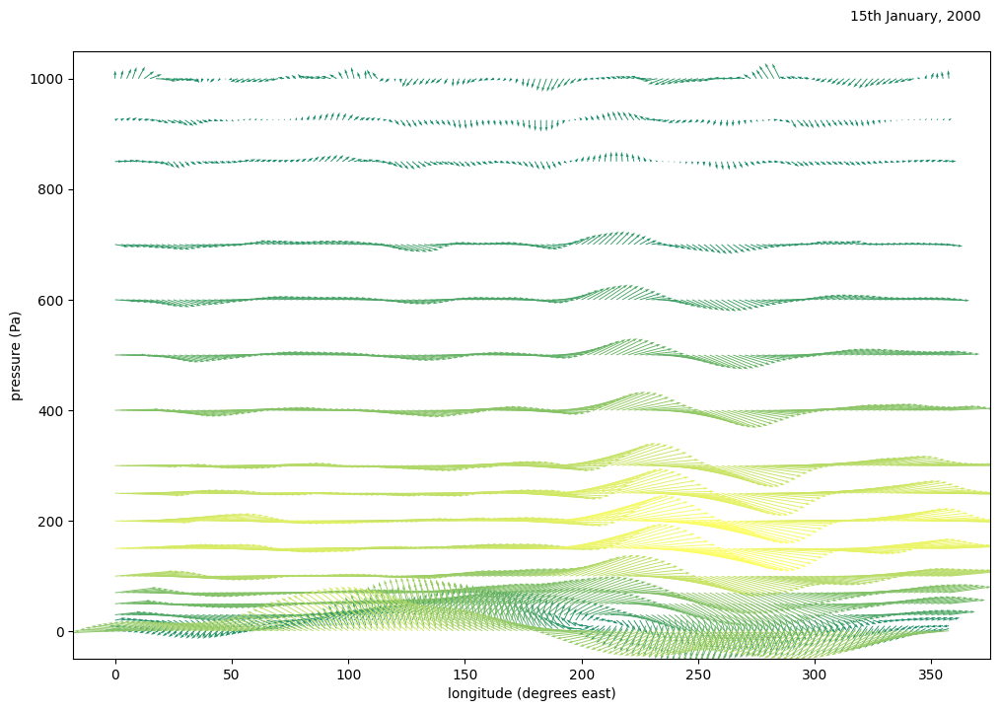

In [15]:
%%time
#animation by time, average lat (or plev)
ds = ds_hist
mean_dim = 'lat'
frames = ds.time.size

fig = plt.figure(figsize=(12,8))
ax = plt.axes()

def animate(num):
    ax.clear()
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%dth %B, %Y')
    ax.text(0.99, 1.05, formatted, ha='right', transform=ax.transAxes)
    
    u = ds.ua.isel(time=num).mean(dim=mean_dim) # slicing to get every 4th element
    v = ds.va.isel(time=num).mean(dim=mean_dim)
    windspeed = (v**2 + u**2)**0.5
    
    qv = ax.quiver(u.lon, u.plev, u, v, windspeed, scale=200, width=0.001, cmap='summer')
    ax.set_xlabel('longitude (degrees east)')
    ax.set_ylabel('pressure (Pa)')

ani = animation.FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_mean-lat.gif', writer='pillow')

CPU times: total: 19 s
Wall time: 20.2 s


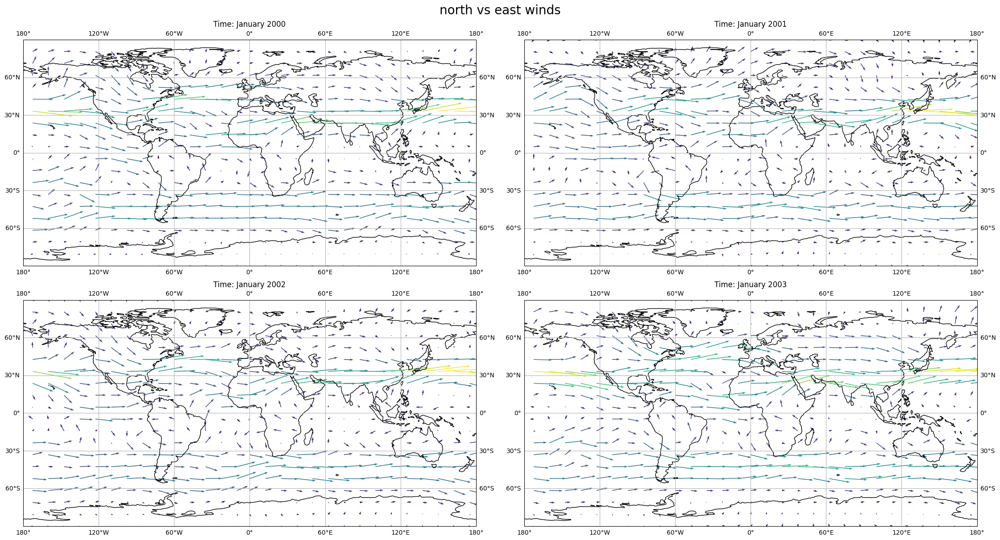

In [16]:
%%time
# required values for animation
ds = ds_hist
times_index = np.arange(0,12*4, 12)
pressure_index = 9
row,col = math.ceil(len(times_index)**0.5), round(len(times_index)**0.5)

fig, axs = plt.subplots(row,col, figsize=(col*12, row*6), layout='compressed', subplot_kw=
                        {'projection': ccrs.PlateCarree()})
fig.suptitle('north vs east winds', size=20)


# i = 0
# for ax in axs.flat:
#     if i < len(times_index):
#         i += 1
#     else:
#         ax.remove()
def animate(num, times=times_index):
    times=times+num
    for i, ax in enumerate(axs.flat):
        ax.clear()
        u = ds.ua.isel(plev=9, time=times[i])[::5, ::5] # slicing to get every 5th point
        v = ds.va.isel(plev=9, time=times[i])[::5, ::5]
        ax.quiver(u.lon, u.lat, u, v, (v**2 + u**2)**0.5, transform=ccrs.PlateCarree(), scale=800, width=0.0015)
        ax.coastlines(color='k')
        ax.gridlines(draw_labels=True)
        
        date = dt.strptime(str(ds.time[times[i]].values), '%Y-%m-%d %H:%M:%S')
        formatted = date.strftime('%B %Y')
        ax.set_title('Time: %s' %formatted)
        


anim = animation.FuncAnimation(fig, animate, interval=400, frames=12)
anim.save('wind_qv_subp-comp.gif', writer='pillow')

# Streamline

## different ways of showing strength of wind

CPU times: total: 42.6 s
Wall time: 7.72 s


Text(0.5, 1.0, '')

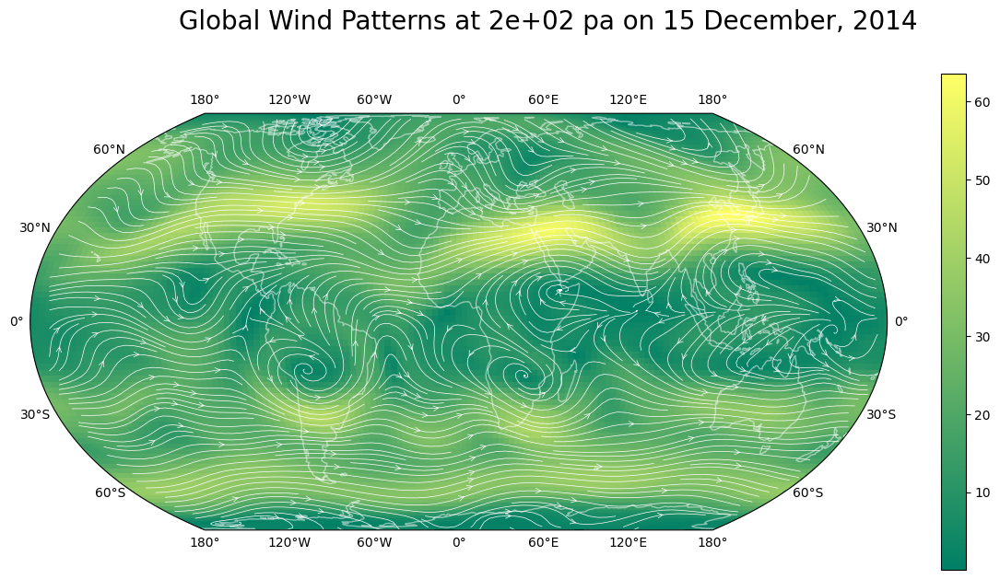

In [17]:
%%time
# via background color
ds = ds_hist
n=-1

fig = plt.figure(figsize=(15,7))
ax = plt.axes(projection=ccrs.EqualEarth())

u = ds.ua.isel(plev=9, time=-1)
v = ds.va.isel(plev=9, time=-1)

windspeed = (u**2 + v**2)**0.5

u = u[::2,::2]
v = v[::2,::2]

ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), density=3, arrowstyle='->', color='w', linewidth=0.5)
windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='summer')
ax.coastlines(color='w', alpha=0.5, lw=1)
ax.gridlines(draw_labels=True, color='none')
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%d %B, %Y')
fig.suptitle('Global Wind Patterns at %.g pa on %s' %(ds.plev[9].values, formatted), size=20)
ax.set_title('')

CPU times: total: 2min 43s
Wall time: 16.1 s


Text(0.5, 1.0, '')

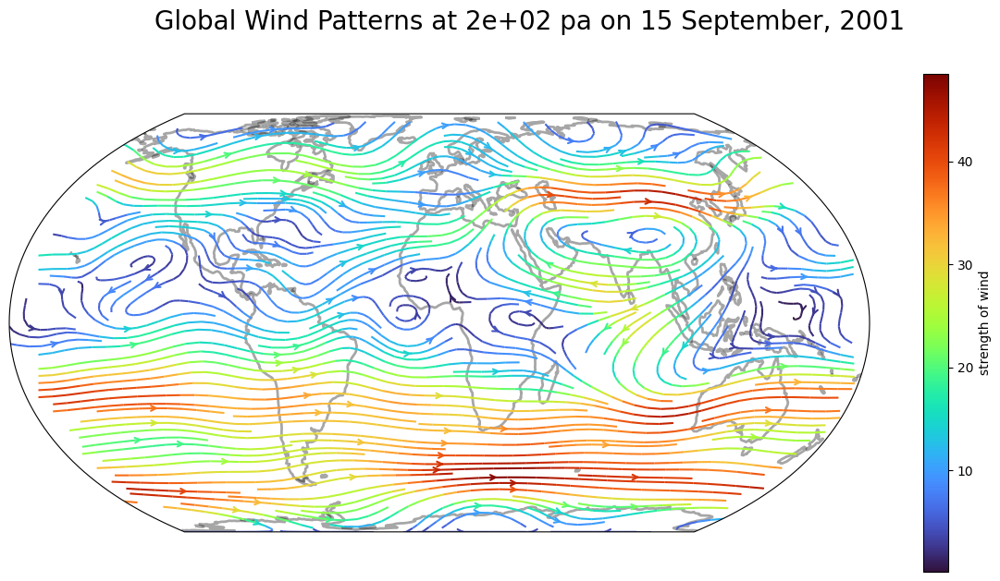

In [18]:
%%time
#via streamline color
ds = ds_hist
n = 20
p = 10

fig = plt.figure(figsize=(15,7))
ax = plt.axes(projection=ccrs.EqualEarth())

u = ds.ua.isel(plev=p, time=n)[::2, ::2]
v = ds.va.isel(plev=p, time=n)[::2, ::2]
windspeed = (u**2 + v**2)**0.5

strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), density=2, arrowstyle='->', color=windspeed.values, cmap='turbo')
fig.colorbar(strm.lines, ax=ax, label='strength of wind')
ax.coastlines(color='k', alpha=0.35, lw=2)
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%d %B, %Y')
fig.suptitle('Global Wind Patterns at %.g pa on %s' %(ds.plev[p].values, formatted), size=20)
ax.set_title('')

CPU times: total: 6min 27s
Wall time: 38.2 s


Text(0.5, 0.98, 'Global Wind Patterns at 2e+02 pa during December 2014')

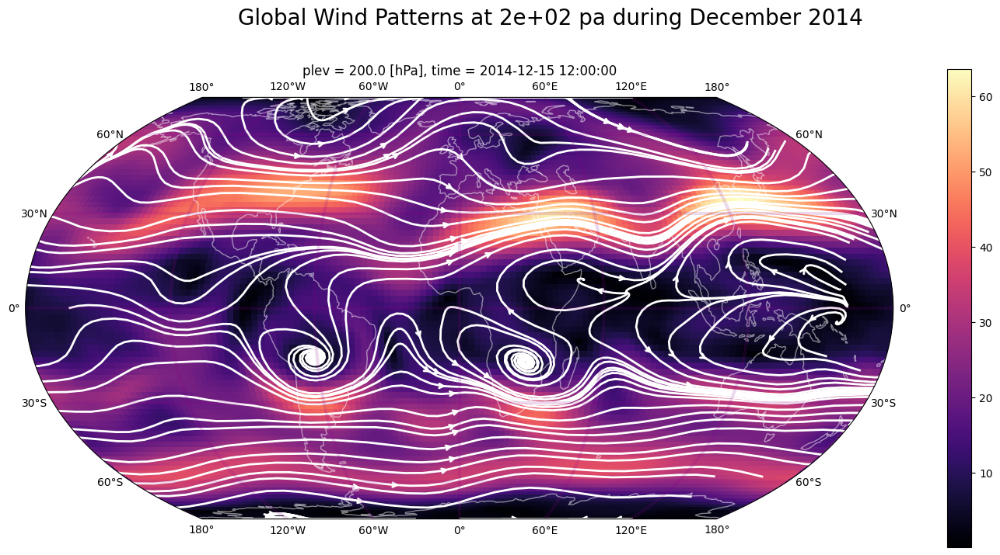

In [19]:
%%time
# via background color and continuous lines
ds = ds_hist
n=-1

fig = plt.figure(figsize=(18,8))
ax = plt.axes(projection=ccrs.EqualEarth())

u = ds.ua.isel(plev=9, time=n)
v = ds.va.isel(plev=9, time=n)

windspeed = (u**2 + v**2)**0.5
windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='magma')

strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color='w', arrowstyle='->', density = 0.7, linewidth=2, broken_streamlines=False)

ax.coastlines(color='w', alpha=0.5)
ax.gridlines(draw_labels=True, color='darkmagenta', lw=3, alpha=0.15)
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%B %Y')
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)


CPU times: total: 1min 49s
Wall time: 11.6 s


Text(0.5, 1.0, '')

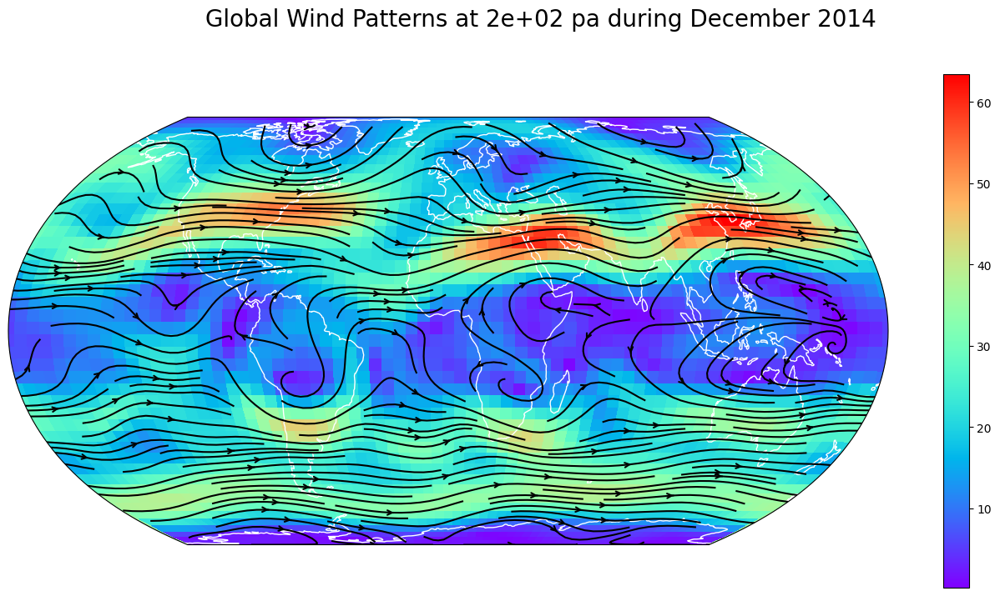

In [20]:
%%time

# via density of lines
ds = ds_hist
n=-1

fig = plt.figure(figsize=(17,8))
ax = plt.axes(projection=ccrs.EqualEarth())

u = ds.ua.isel(plev=9, time=n)[::2, ::2]
v = ds.va.isel(plev=9, time=n)[::2, ::2]

windspeed = (u**2 + v**2)**0.5

windspeed.plot(ax=ax, cmap='rainbow', transform=ccrs.PlateCarree())
strm=ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), density=[1,3], arrowstyle='->', color='k', linewidth=1.5)


ax.coastlines(color='w')
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%B %Y')
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)
ax.set_title('')

CPU times: total: 10min 30s
Wall time: 1min 1s


Text(0.5, 1.0, '')

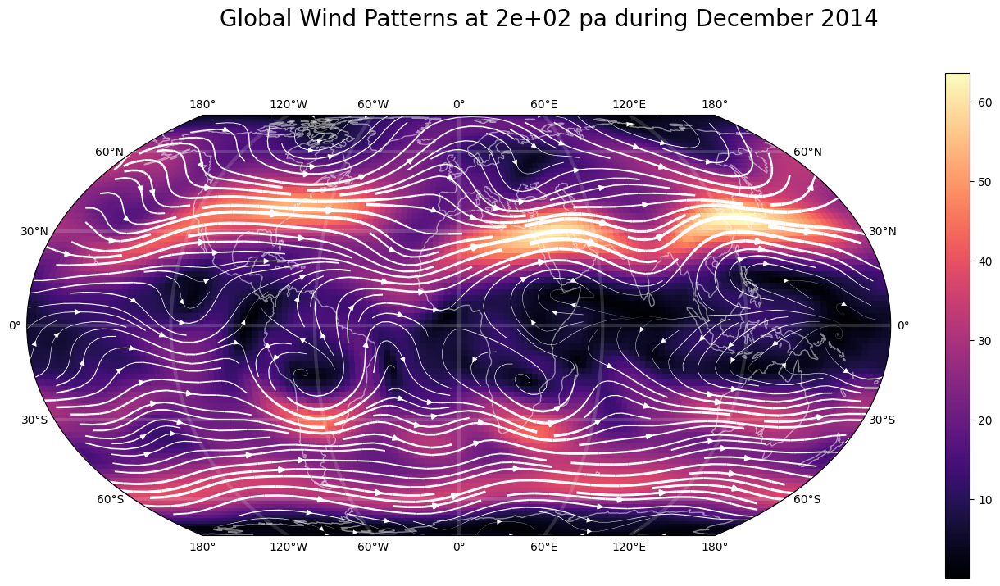

In [21]:
%%time

# via width of streamplot lines
ds = ds_hist
n=-1 # picking timestep

# creating container
fig = plt.figure(figsize=(17,8))
ax = plt.axes(projection=ccrs.EqualEarth())

# selecting pressure level, time
u = ds.ua.isel(plev=9, time=n)
v = ds.va.isel(plev=9, time=n)

# calculating and plotting strength of wind
windspeed = (u**2 + v**2)**0.5
windspeed.plot(ax=ax, cmap='magma', transform=ccrs.PlateCarree())

# transforming windspeed into usable format for line width

lw = 4* (windspeed.values / windspeed.values.max())

# plotting vectors of wind
strm=ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color='w', linewidth=lw, density = 2)


ax.coastlines(color='w', alpha=0.5)
ax.gridlines(draw_labels=True, color='w', lw=3, alpha=0.15)
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%B %Y')
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)
ax.set_title('')

## just some pretty ones

CPU times: total: 1min 45s
Wall time: 14 s


Text(0.5, 1.0, '')

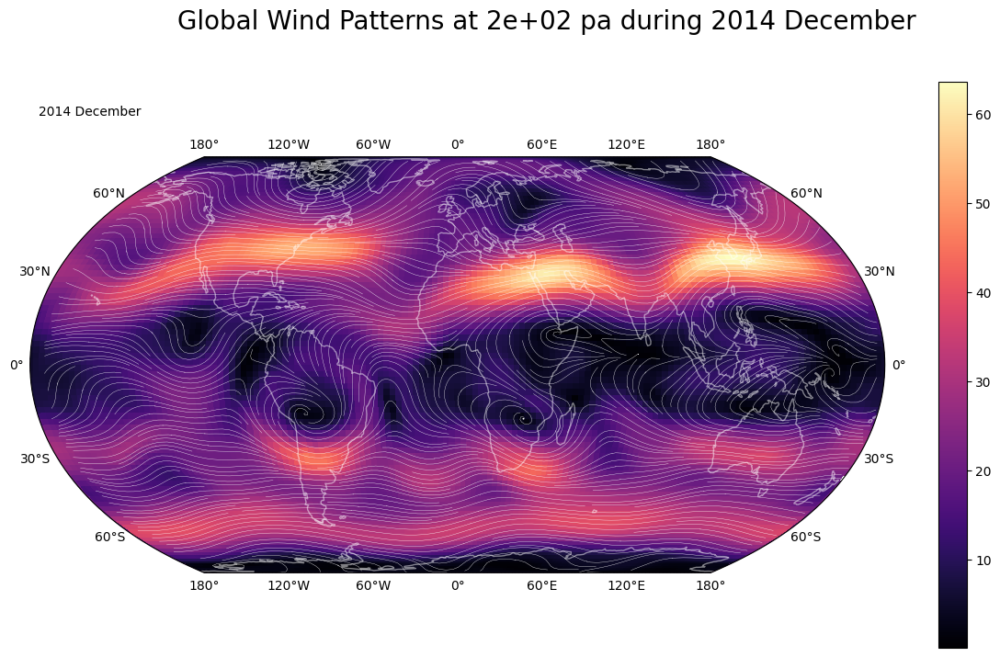

In [22]:
%%time

ds = ds_hist
n=-1


fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

u = ds.ua.isel(plev=9, time=-1)
v = ds.va.isel(plev=9, time=-1)

windspeed = (u**2 + v**2)**0.5

u = u[::2,::2]
v = v[::2,::2]

ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), density=4, arrowstyle='-', color='w', linewidth=0.25)
windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='magma')
ax.coastlines(color='w', alpha=0.5)
ax.gridlines(draw_labels=True, color='none')
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%Y %B')
ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)
fig.suptitle('Global Wind Patterns at %.g pa during %s' %(ds.plev[9].values, formatted), size=20)
ax.set_title('')

CPU times: total: 3min 6s
Wall time: 21.8 s


Text(0.01, 1.1, '2014 December')

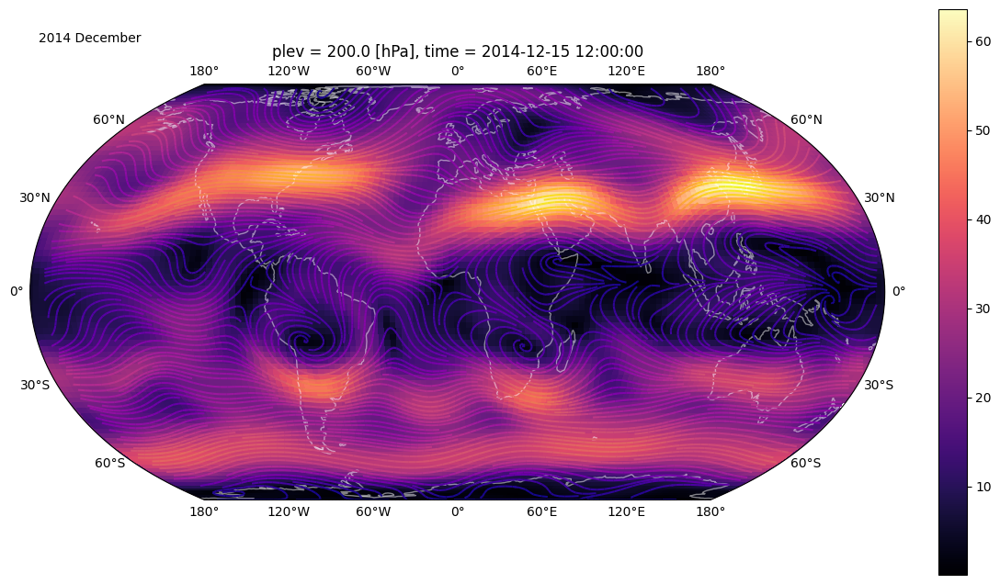

In [23]:
%%time

ds = ds_hist
n=-1

fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

u = ds.ua.isel(plev=9, time=-1)
v = ds.va.isel(plev=9, time=-1)

windspeed = (u**2 + v**2)**0.5

u = u[::2,::2]
v = v[::2,::2]

ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), density=4, arrowstyle='-', color=windspeed[::2,::2].values, cmap='plasma')
windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='magma')
ax.coastlines(color='w', alpha=0.5)
ax.gridlines(draw_labels=True, color='none')
date = dt.strptime(str(ds.time[n].values), '%Y-%m-%d %H:%M:%S')
formatted = date.strftime('%Y %B')
ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)

## animations

CPU times: total: 7h 11min 35s
Wall time: 51min 52s


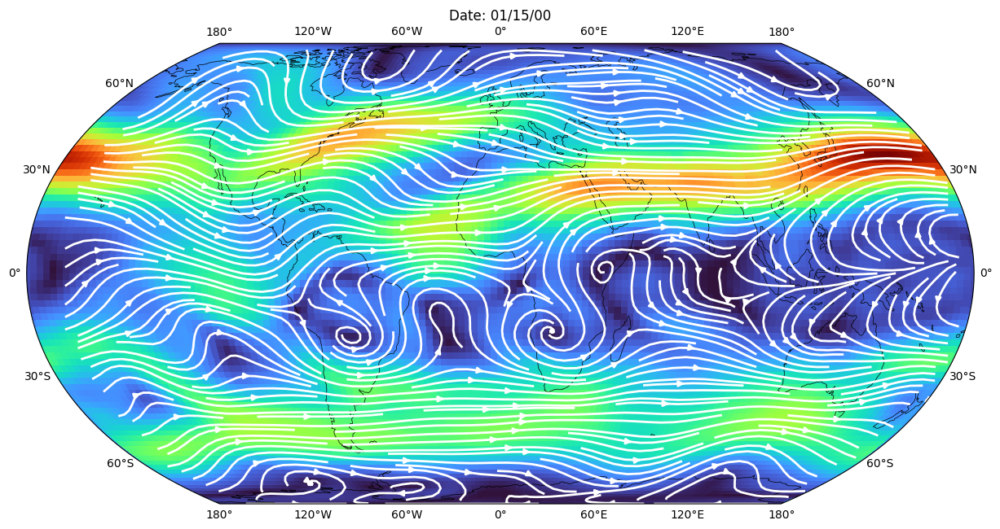

In [24]:
%%time

ds = ds_hist
pressure = 200
frames = ds.ua.time.size

fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

def animate(num):
    ax.clear()
    u = ds.ua.isel(time=num).sel(plev=pressure)
    v = ds.va.isel(time=num).sel(plev=pressure)
    
    windspeed = (u**2 + v**2)**0.5
    
    windspeed.plot(ax=ax, transform=ccrs.PlateCarree(), cmap='turbo')
    ax.collections[-2].colorbar.remove()

    u = u[::4, ::4]; v = v[::4, ::4]
    
    strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color='w', density = 2.5, linewidth=2)
    # plt.colorbar(strm.lines)
    
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%D')
    ax.set_title('Date: %s' %formatted, ha='center')
    ax.coastlines(color='k', lw=0.5)
    ax.gridlines(draw_labels=True, color='none')
    

ani = animation.FuncAnimation(fig, animate, interval=200, frames=frames)
ani.save('wind_strm_bg.gif', writer='pillow')


CPU times: total: 14min 24s
Wall time: 1min 27s


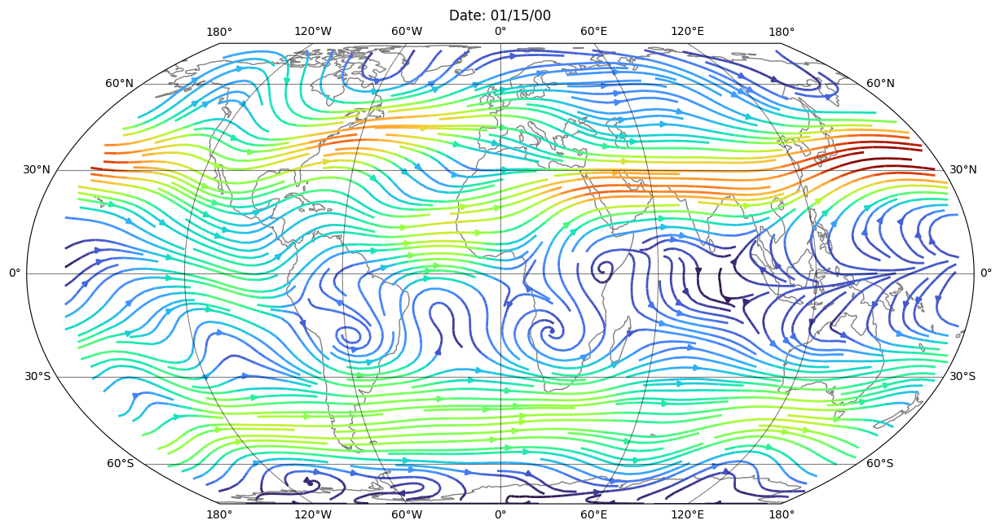

In [25]:
%%time

ds = ds_hist
pressure = 200
frames = ds.ua.time.size

fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

def animate(num):
    ax.clear()
    u = ds.ua.isel(time=num).sel(plev=pressure)[::4, ::4] # slicing to get every 4th element
    v = ds.va.isel(time=num).sel(plev=pressure)[::4, ::4]
    
    windspeed = (u**2 + v**2)**0.5
    
    strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color=windspeed.values, cmap='turbo', density = 2.5, linewidth=2)
    # plt.colorbar(strm.lines)
    
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%D')
    ax.set_title('Date: %s' %formatted, ha='center')
    ax.coastlines(color='grey')
    ax.gridlines(draw_labels=True, color='k', alpha=0.5)
    

ani = animation.FuncAnimation(fig, animate, interval=200, frames=2)
ani.save('wind_strm_turbo.gif', writer='pillow')


CPU times: total: 44min 11s
Wall time: 4min 20s


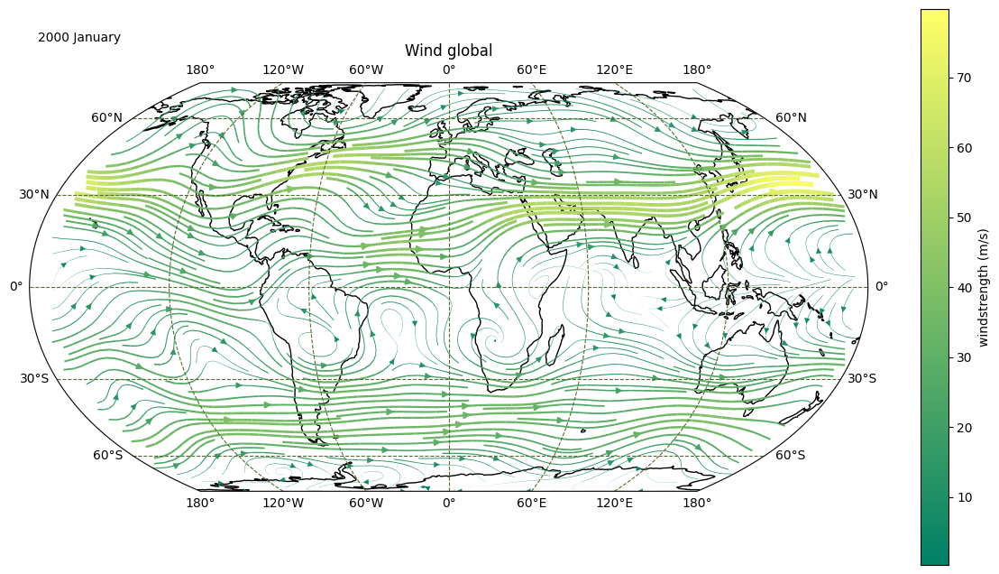

In [26]:
%%time

ds = ds_hist
pressure = 200
frames = ds.ua.time.size

fig = plt.figure(figsize=(15,8))
ax = plt.axes(projection=ccrs.EqualEarth())

def animate(num):
    fig.clear()
    ax = plt.axes(projection=ccrs.EqualEarth())
    ax.set_title('Wind global')
    u = ds.ua.isel(time=num).sel(plev=pressure)[::2, ::2] # slicing to get every 4th element
    v = ds.va.isel(time=num).sel(plev=pressure)[::2, ::2]
    
    windspeed = (u**2 + v**2)**0.5
    lw = 4* (windspeed.values / windspeed.values.max())
    strm = ax.streamplot(u.lon, u.lat, u, v, transform=ccrs.PlateCarree(), color=windspeed.values, cmap='summer', density = 2.5, linewidth=lw)
    fig.colorbar(strm.lines, label='windstrength (m/s)')
    
    date = dt.strptime(str(ds.time[num].values), '%Y-%m-%d %H:%M:%S')
    formatted = date.strftime('%Y %B')
    ax.text(0.01, 1.1, formatted, ha='left', transform=ax.transAxes)
    ax.coastlines(color='k')
    ax.gridlines(draw_labels=True, ls='--', color='darkolivegreen')
    

ani = animation.FuncAnimation(fig, animate, interval=200, frames=2)
ani.save('wind_strm_summer.gif', writer='pillow')


# Barb plots

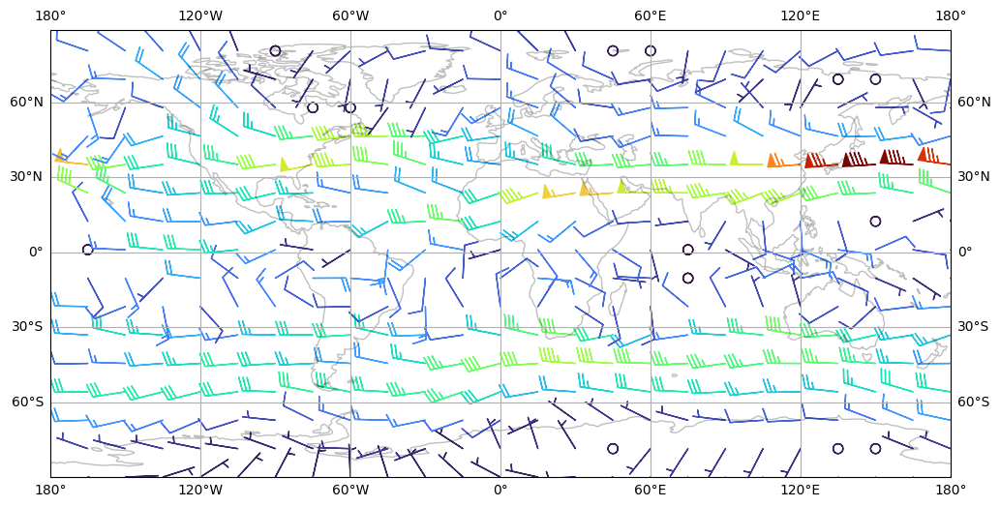

In [27]:
ds = ds_hist
p = 9
n = 24
fig = plt.figure(figsize=(12,8))
ax = plt.axes(projection=ccrs.PlateCarree())
u = ds.ua.isel(plev=p, time=n)[::6, ::6] # slicing to get every 4th element
v = ds.va.isel(plev=p, time=n)[::6, ::6]


barb = ax.barbs(u.lon, u.lat, u, v, np.sqrt(u** 2 + v** 2), transform=ccrs.PlateCarree(), cmap='turbo', length=7)
ax.coastlines(color='k', alpha=0.25)
ax.gridlines(draw_labels=True)